<a href="https://colab.research.google.com/github/LysanetsAndriy/HackDisaster/blob/main/HackDisaster_count_classes_pixels_v1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Setup


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
! mkdir /content/drive/MyDrive/CVAT/data

mkdir: cannot create directory ‘/content/drive/MyDrive/CVAT/data’: No such file or directory


In [ ]:
! unzip /content/drive/MyDrive/CVAT/Dataset_CVAT.zip -d /content/drive/MyDrive/CVAT/data

Archive:  /content/drive/MyDrive/CVAT/Dataset_CVAT.zip
replace /content/drive/MyDrive/CVAT/data/annotations.xml? [y]es, [n]o, [A]ll, [N]one, [r]ename: N


# Import libraries

In [ ]:
import os
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import random
import multiprocessing
from tqdm import tqdm
import xml.etree.ElementTree as ET
from PIL import Image, ImageDraw
from torch.utils.data import Dataset
import torchvision.transforms as T
from torchvision import transforms
from torch.utils.data import random_split, DataLoader
import numpy as np
import torch
from sklearn.model_selection import train_test_split
from torchvision.transforms.functional import InterpolationMode
from scipy.ndimage import center_of_mass
from collections import defaultdict
from scipy.ndimage import label

# Config

In [ ]:
cpu_count_os = os.cpu_count()
print(f"Number of CPUs available (os.cpu_count): {cpu_count_os}")

max_workers = cpu_count_os
print(f"Suggested max_workers for DataLoader: {max_workers}")


Number of CPUs available (os.cpu_count): 2
Suggested max_workers for DataLoader: 2


In [ ]:
class Config:
  #path
  data_dir = '/content/drive/MyDrive/CVAT/data'
  image_dir = os.path.join(data_dir, 'images', 'default')
  annotations_file = os.path.join(data_dir, 'annotations.xml')
  logdir = 'logdir'

  patched_dataset_dir = '/content/analyze_full_dataset_zipped'
  patched_dataset_dir_train = os.path.join(patched_dataset_dir, "train")
  patched_dataset_dir_val = os.path.join(patched_dataset_dir, "val")
  patched_dataset_dir_test = os.path.join(patched_dataset_dir, "test")

  gdrive_archive_path = '/content/drive/MyDrive/CVAT/analyze_full_dataset_zipped.zip'
  gdrive_archive_path_train = os.path.join(patched_dataset_dir, "train")
  gdrive_archive_path_val = os.path.join(patched_dataset_dir, "val")
  gdrive_archive_path_test = os.path.join(patched_dataset_dir, "test")

  #dataset
  seed = 1212


In [ ]:
def set_seed(seed):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)

set_seed(Config.seed)

# Datset Parsing

In [ ]:
def parse_annotations(xml_file):
    """
    Parse the annotations XML file to extract unique labels, polygon, and box data.

    Args:
        xml_file (str): Path to the annotations XML file.

    Returns:
        tuple: A dictionary mapping each unique label to an integer,
               and a list of dictionaries containing image metadata and polygon/box data.
    """
    # Parse XML file
    tree = ET.parse(xml_file)
    root = tree.getroot()

    unique_labels = set()
    annotations = []

    # Iterate through each image and collect labels, polygons, and boxes
    for image in root.findall('image'):
        image_data = {
            'image_name': image.get('name'),
            'width': int(image.get('width')),
            'height': int(image.get('height')),
            'polygons': [],
            'boxes': []
        }

        # Collect polygons
        for polygon in image.findall('polygon'):
            label = polygon.get('label')
            if label:
                if label == 'Damaged roof':
                  label = 'Damage'
                elif label == 'Roof':
                  label = 'Building'
                unique_labels.add(label)
                points = polygon.get('points')
                polygon_data = {
                    'label': label,
                    'points': points
                }
                image_data['polygons'].append(polygon_data)

        # Collect boxes
        for box in image.findall('box'):
            label = box.get('label')
            if label:
                if label == 'Damaged roof':
                  label = 'Damage'
                elif label == 'Roof':
                  label = 'Building'
                unique_labels.add(label)
                xtl, ytl, xbr, ybr = map(float, [box.get('xtl'), box.get('ytl'), box.get('xbr'), box.get('ybr')])
                box_data = {
                    'label': label,
                    'xtl': xtl,
                    'ytl': ytl,
                    'xbr': xbr,
                    'ybr': ybr
                }
                image_data['boxes'].append(box_data)

        if image_data['polygons'] or image_data['boxes']:
            annotations.append(image_data)

    label_mapping = {
        'Other': 0,
        'Broken Window': 1,
        'Building': 2,
        'Damage': 3,
        # 'Damaged roof': 4,
        # 'Roof': 5
    }

    # label_mapping = {label: idx + 1 for idx, label in enumerate(sorted(unique_labels))}
    return label_mapping, annotations


In [ ]:
label_mapping, annotations = parse_annotations(Config.annotations_file)

In [ ]:
print("Label Mapping:")
print(label_mapping)
print("\nSample Annotations:")
print(annotations[:2])

Label Mapping:
{'Other': 0, 'Broken Window': 1, 'Building': 2, 'Damage': 3}

Sample Annotations:
[{'image_name': 'image1.png', 'width': 1848, 'height': 966, 'polygons': [{'label': 'Other', 'points': '769.14,261.71;774.29,258.29;774.29,239.43;801.71,230.86;794.86,205.14;890.86,188.00;890.86,150.29;1065.71,150.29;1058.86,230.86;1112.00,234.29;1831.96,-0.00;1479.66,0.00;770.86,1.14'}, {'label': 'Building', 'points': '798.80,208.74;802.23,239.60;776.51,244.74;778.23,265.31;767.94,263.60;783.37,875.60;1141.66,882.46;1146.80,810.46;1102.23,719.60;1114.23,241.31;1055.94,241.31;1059.37,152.17;894.80,157.31;896.51,193.31'}, {'label': 'Other', 'points': '1112.51,342.46;1103.94,719.60;1153.66,813.89;1143.37,889.31;778.23,879.03;769.70,966.00;771.80,966.00;1848.00,964.70;1844.51,736.74;1844.51,1.31;1112.51,237.89;1054.23,237.89;1115.94,239.60;1115.94,244.74'}, {'label': 'Damage', 'points': '1112.51,340.74;1045.66,342.46;1049.09,433.31;893.09,436.74;894.80,484.74;793.66,484.74;791.94,558.46;774.80,

In [ ]:
def transform_boxes_to_polygons(annotations):
    """
    Transform bounding box annotations into a polygon-like format and add them to the dataset.

    Args:
        annotations (list): List of image annotations, each containing 'polygons' and 'boxes'.

    Returns:
        list: Updated annotations with boxes transformed into polygons.
    """
    updated_annotations = []

    for image_data in annotations:
        # Create a deep copy of image data to avoid modifying the original
        new_image_data = {
            'image_name': image_data['image_name'],
            'width': image_data['width'],
            'height': image_data['height'],
            'polygons': image_data['polygons'][:]
        }

        # Convert each box to polygon format and add to 'polygons' list
        for box in image_data.get('boxes', []):
            label = box['label']
            xtl, ytl, xbr, ybr = box['xtl'], box['ytl'], box['xbr'], box['ybr']

            # Define the four corners of the box
            box_points = f"{xtl},{ytl};{xbr},{ytl};{xbr},{ybr};{xtl},{ybr}"

            # Create a new polygon data dictionary
            box_as_polygon = {
                'label': label,
                'points': box_points
            }

            # Append the converted box (now as a polygon) to the polygons list
            new_image_data['polygons'].append(box_as_polygon)

        # Append the updated image data to the list
        updated_annotations.append(new_image_data)

    return updated_annotations


In [ ]:
# Apply the transformation to the annotations
annotations_with_polygons = transform_boxes_to_polygons(annotations)

print("Sample of transformed annotations with boxes as polygons:")
print(annotations_with_polygons[:2])
annotations = annotations_with_polygons

Sample of transformed annotations with boxes as polygons:
[{'image_name': 'image1.png', 'width': 1848, 'height': 966, 'polygons': [{'label': 'Other', 'points': '769.14,261.71;774.29,258.29;774.29,239.43;801.71,230.86;794.86,205.14;890.86,188.00;890.86,150.29;1065.71,150.29;1058.86,230.86;1112.00,234.29;1831.96,-0.00;1479.66,0.00;770.86,1.14'}, {'label': 'Building', 'points': '798.80,208.74;802.23,239.60;776.51,244.74;778.23,265.31;767.94,263.60;783.37,875.60;1141.66,882.46;1146.80,810.46;1102.23,719.60;1114.23,241.31;1055.94,241.31;1059.37,152.17;894.80,157.31;896.51,193.31'}, {'label': 'Other', 'points': '1112.51,342.46;1103.94,719.60;1153.66,813.89;1143.37,889.31;778.23,879.03;769.70,966.00;771.80,966.00;1848.00,964.70;1844.51,736.74;1844.51,1.31;1112.51,237.89;1054.23,237.89;1115.94,239.60;1115.94,244.74'}, {'label': 'Damage', 'points': '1112.51,340.74;1045.66,342.46;1049.09,433.31;893.09,436.74;894.80,484.74;793.66,484.74;791.94,558.46;774.80,558.46;783.37,875.60;1143.37,882.46;114

# Data visualization

In [ ]:
color_mapping = {
    0: (211, 211, 211, 150),  # Light grey for 'Other', semi-transparent
    1: (0, 0, 255, 128),      # Blue for 'Broken Window', semi-transparent
    2: (0, 255, 0, 64),      # Green for 'Building', semi-transparent
    3: (255, 0, 255, 64),    # Purpule for 'Damage', semi-transparent
    # 4: (255, 0, 0, 128),      # Red for 'Damaged roof', semi-transparent
    # 5: (255, 165, 0, 128)    # Orange for 'Roof', semi-transparent
}

In [ ]:
def load_image(image_path):
    """
    Load an image from the specified path and return it as a PIL image.

    Args:
        image_path (str): Path to the image file.

    Returns:
        PIL.Image: Loaded image.
    """
    return Image.open(image_path).convert("RGB")

In [ ]:
def create_mask(image_data, label_mapping, width, height):
    """
    Create a binary mask for a single image based on the polygon annotations.

    Args:
        image_data (dict): Annotation data for a single image, containing polygon coordinates.
        label_mapping (dict): Mapping of labels to integer values for mask encoding.
        width (int): Width of the mask (same as image width).
        height (int): Height of the mask (same as image height).

    Returns:
        numpy.array: Mask with polygons drawn for segmentation.
    """
    priority_order = {
        "Broken Window": 3,
        # "Damaged roof": 4,
        "Damage": 2,
        # "Roof": 2,
        "Building": 1,
        "Other": 0
    }

    # Sort polygons by priority (lower priority values are drawn first)
    sorted_polygons = sorted(image_data['polygons'], key=lambda p: priority_order.get(p['label']))

    mask = Image.new("RGBA", (width, height), (211, 211, 211, 150))  # Create an empty mask

    labels = []

    for polygon in sorted_polygons:
        label = polygon['label']
        points = polygon['points']
        points = [tuple(map(float, p.split(','))) for p in points.split(';')]

        labels.append(label)

        color = color_mapping[label_mapping[label]]

        # Draw polygon on the mask
        draw = ImageDraw.Draw(mask, "RGBA")
        draw.polygon(points, fill=color)
    print(labels)
    return np.array(mask)

In [ ]:
def visualize_samples(annotations, label_mapping, num_samples=1):
    """
    Visualize a few samples from the dataset with their annotations overlayed.

    Args:
        annotations (list): List of image annotations.
        label_mapping (dict): Dictionary mapping labels to integers.
        num_samples (int): Number of samples to visualize.
    """
    plt.figure(figsize=(15, num_samples * 5))

    for i, image_data in enumerate(random.sample(annotations, num_samples)):
        image_path = os.path.join(Config.image_dir, image_data['image_name'])
        image = load_image(image_path)
        mask = create_mask(image_data, label_mapping, image.width, image.height)

        plt.subplot(num_samples, 1, i+1)
        plt.imshow(image)
        # plt.title(f"Original Image: {image_data['image_name']}")
        plt.imshow(mask, alpha=0.7)
        plt.axis("off")

    plt.tight_layout()
    plt.show()


In [ ]:
print(annotations[6])

{'image_name': 'image7.png', 'width': 1848, 'height': 966, 'polygons': [{'label': 'Damage', 'points': '659.38,796.39;664.52,828.94;721.04,832.36;719.32,804.96'}, {'label': 'Building', 'points': '482.97,167.83;510.37,126.73;563.47,118.17;575.46,118.17;585.73,101.04;613.14,102.75;640.54,95.90;664.52,87.34;724.46,82.20;734.74,59.94;748.44,73.64;834.07,42.81;900.87,49.66;918.00,58.22;953.96,58.22;957.39,46.23;964.24,61.65;1000.21,65.07;1007.06,46.23;1031.03,47.95;1031.03,59.94;1061.86,61.65;1031.03,61.65;1010.48,44.52;1000.21,63.36;960.81,59.94;916.28,61.65;894.02,46.23;832.36,46.23;743.30,77.06;724.46,82.20;662.80,87.34;638.83,90.76;608.00,104.47;584.02,104.47;573.74,119.88;506.95,128.44'}, {'label': 'Damage', 'points': '676.51,363.08;676.51,411.04;731.31,411.04;729.60,366.51'}, {'label': 'Broken Window', 'points': '491.53,510.37;494.96,525.79;529.21,534.35;542.92,534.35;541.20,518.94'}, {'label': 'Broken Window', 'points': '491.53,381.92;486.40,400.76;566.89,399.05;597.72,392.20;628.55,3

['Other', 'Other', 'Other', 'Other', 'Building', 'Building', 'Damage', 'Damage', 'Damage', 'Damage', 'Damage', 'Damage', 'Damage', 'Damage', 'Damage', 'Damage', 'Damage', 'Damage', 'Damage', 'Damage', 'Damage', 'Damage', 'Damage', 'Damage', 'Damage', 'Damage', 'Damage', 'Damage', 'Damage', 'Damage', 'Broken Window', 'Broken Window', 'Broken Window', 'Broken Window', 'Broken Window', 'Broken Window', 'Broken Window']
['Other', 'Other', 'Building', 'Building', 'Building', 'Damage', 'Damage', 'Damage', 'Damage', 'Damage', 'Damage', 'Damage', 'Damage', 'Damage', 'Damage', 'Damage', 'Damage', 'Damage', 'Damage', 'Damage', 'Damage']
['Other', 'Other', 'Building', 'Damage', 'Damage', 'Damage', 'Damage', 'Damage', 'Broken Window', 'Broken Window', 'Broken Window', 'Broken Window', 'Broken Window', 'Broken Window', 'Broken Window']
['Other', 'Other', 'Building', 'Building', 'Building', 'Damage', 'Damage', 'Damage', 'Damage', 'Damage', 'Damage', 'Damage', 'Damage', 'Damage', 'Damage', 'Damage', 

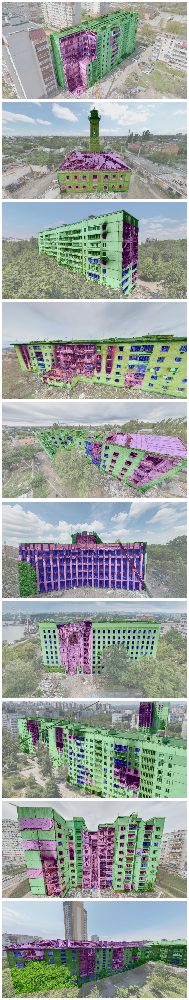

In [ ]:
visualize_samples(annotations, label_mapping, num_samples=10)

Broken Window: **Blue**, Building: **Green**, Damage: **Purple**, Other: **Grey**



---



# Create label mask

In [ ]:
def create_label_mask(image_data, label_mapping, width, height):
    """
    Create an integer label mask for a single image, where each pixel's value
    corresponds to the class ID.

    Args:
        image_data (dict): Annotation data for a single image, containing polygon coordinates.
        label_mapping (dict): Mapping of labels to integer values.
        width (int): Width of the mask (same as image width).
        height (int): Height of the mask (same as image height).

    Returns:
        numpy.array: Integer mask where each pixel contains the class ID (0 to 5).
    """
    # Priority order for rendering polygons (lower priority values are drawn first)
    priority_order = {
        "Broken Window": 3,
        # "Damaged roof": 4,
        "Damage": 2,
        # "Roof": 2,
        "Building": 1,
        "Other": 0
    }

    # Sort polygons by priority
    sorted_polygons = sorted(image_data['polygons'], key=lambda p: priority_order.get(p['label'], 0))

    # Initialize mask with zeros ('Other')
    mask = np.zeros((height, width), dtype=np.int32)

    for polygon in sorted_polygons:
        label = polygon['label']
        points = polygon['points']
        points = [tuple(map(float, p.split(','))) for p in points.split(';')]

        # Get the class ID for the label
        class_id = label_mapping[label]

        # Draw polygon with the corresponding class ID
        pil_mask = Image.fromarray(mask)
        draw = ImageDraw.Draw(pil_mask)
        draw.polygon(points, fill=class_id)
        mask = np.array(pil_mask)  # Update mask

    return mask

In [ ]:
def apply_color_mapping(mask, color_mapping):
    """
    Apply color mapping to the integer mask.

    Args:
        mask (numpy.array): Integer mask where each pixel contains the class ID.
        color_mapping (dict): Dictionary mapping class IDs to RGBA color tuples.

    Returns:
        numpy.array: RGBA image representing the color-mapped mask.
    """
    h, w = mask.shape
    mask_colored = np.zeros((h, w, 4), dtype=np.uint8)  # Initialize RGBA image
    for class_id, color in color_mapping.items():
        mask_colored[mask == class_id] = color  # Assign RGBA color to class ID pixels
    return mask_colored

In [ ]:
def visualize_label_masks(samples, label_mapping, image_dir, mask_height, mask_width, color_mapping):
    """
    Visualize label masks for a set of sample data examples with color mapping.

    Args:
        samples (list): A list of sample annotations to visualize (e.g., `annotations[:5]`).
        label_mapping (dict): Dictionary mapping labels to integer IDs.
        image_dir (str): Directory containing the images.
        mask_height (int): Height of the mask (should match the image height).
        mask_width (int): Width of the mask (should match the image width).
        color_mapping (dict): Dictionary mapping class IDs to RGBA colors.
    """
    plt.figure(figsize=(15, len(samples) * 5))
    for idx, sample in enumerate(samples):
        # Load image
        image_path = os.path.join(image_dir, sample['image_name'])
        image = Image.open(image_path).convert("RGB")

        # Generate label mask for the sample
        mask = create_label_mask(sample, label_mapping, mask_width, mask_height)

        # Apply color mapping to the mask
        mask_colored = apply_color_mapping(mask, color_mapping)

        # Plot image and mask
        plt.subplot(len(samples), 2, idx * 2 + 1)
        plt.imshow(image)
        plt.title(f"Original Image: {sample['image_name']}")
        plt.axis('off')

        plt.subplot(len(samples), 2, idx * 2 + 2)
        plt.imshow(mask_colored)
        plt.title("Label Mask with Color Mapping")
        plt.axis('off')

    plt.tight_layout()
    plt.show()

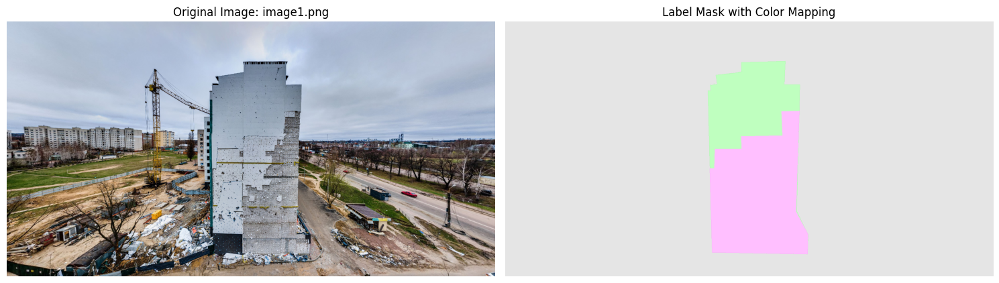

In [ ]:
# Select some samples for visualization
sample_annotations = annotations[0:1]  # Change this to display more or fewer examples

# Assume all images have the same width and height; otherwise, you’ll need to handle each size.
sample_width = sample_annotations[0]['width']
sample_height = sample_annotations[0]['height']

color_mapping = {
    0: (211, 211, 211, 150),  # Light grey for 'Other', semi-transparent
    1: (0, 0, 255, 128),      # Blue for 'Broken Window', semi-transparent
    2: (0, 255, 0, 64),      # Green for 'Building', semi-transparent
    3: (255, 0, 255, 64),    # Purpule for 'Damage', semi-transparent
    # 4: (255, 0, 0, 128),      # Red for 'Damaged roof', semi-transparent
    # 5: (255, 165, 0, 128)    # Orange for 'Roof', semi-transparent
}

# Visualize label masks
visualize_label_masks(sample_annotations, label_mapping, Config.image_dir,
                      sample_height, sample_width, color_mapping=color_mapping)


{'Other': 0, 'Broken Window': 1, 'Building': 2, 'Damage': 3,  'Damaged roof': 4, 'Roof': 5}

# Create dataset

In [ ]:
def process_dataset(annotations, label_mapping):
    """
    Process the entire dataset by creating label masks for all images.

    Args:
        annotations (list): List of annotation data, where each entry corresponds to an image.
        label_mapping (dict): Mapping of label names to integer values.

    Returns:
        list: List of dictionaries containing image names and corresponding label masks.
    """
    dataset_masks = []

    for sample in tqdm(annotations, desc="Processing dataset"):
        image_name = sample['image_name']
        width, height = sample['width'], sample['height']

        # Create label mask for the image
        mask = create_label_mask(sample, label_mapping, width, height)

        dataset_masks.append({"image_name": image_name, "mask": mask})

    return dataset_masks

In [ ]:
dataset_masks = process_dataset(annotations, label_mapping)

Processing dataset: 100%|██████████| 290/290 [01:43<00:00,  2.80it/s]


In [ ]:
print(dataset_masks[0]['mask'].shape)
print(dataset_masks[0])

(966, 1848)
{'image_name': 'image1.png', 'mask': array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=int32)}


# Statistics

In [ ]:
overall_counts = defaultdict(int)
per_image_counts = defaultdict(list)
total_pixels = 0
classes_mapping = ['Other', 'Broken Window', 'Building', 'Damage'] #, 'Damaged roof', 'Roof']

# Process each mask in the dataset.
for item in dataset_masks:
    mask = item['mask']
    total_pixels += mask.size  # Total pixels in this mask.
    # Get unique classes and their counts in this mask.
    classes, counts = np.unique(mask, return_counts=True)
    for cls, cnt in zip(classes, counts):
        overall_counts[cls] += cnt
        per_image_counts[cls].append(cnt)

avg_total_pixels = total_pixels / len(dataset_masks)
# Print overall class counts and percentages.
print("Overall Class Distribution:")
# print(sorted(per_image_counts.items()))
for cls in sorted(overall_counts.keys()):
    count = overall_counts[cls]
    percentage = (count / total_pixels) * 100
    print(f"{classes_mapping[cls]}: Count = {count}, Percentage = {percentage:.2f}%")

print(f"Average total pixels: {avg_total_pixels}")

# Compute and print per-image statistics (mean, median, min, max) for each class.
per_class_stats = []
print("\nPer-image Class Statistics:")
for cls, counts in sorted(per_image_counts.items()):
    counts_arr = np.array(counts)
    mean_val = np.mean(counts_arr) / avg_total_pixels * 100
    median_val = np.median(counts_arr) / avg_total_pixels * 100
    min_val = np.min(counts_arr) / avg_total_pixels * 100
    max_val = np.max(counts_arr) / avg_total_pixels * 100
    stats = {
        "mean": mean_val,
        "median": median_val,
        "min": min_val,
        "max_val": max_val
    }
    per_class_stats.append(stats)
    print(f"{classes_mapping[cls]}: Mean = {mean_val:.2f}%, Median = {median_val:.2f}%, Min = {min_val:.2f}%, Max = {max_val:.2f}%")

# print(per_class_stats)

Overall Class Distribution:
Other: Count = 305809904, Percentage = 66.10%
Broken Window: Count = 12320117, Percentage = 2.66%
Building: Count = 95573344, Percentage = 20.66%
Damage: Count = 48915777, Percentage = 10.57%
Average total pixels: 1595238.4206896552

Per-image Class Statistics:
Other: Mean = 66.10%, Median = 76.89%, Min = 1.34%, Max = 99.53%
Broken Window: Mean = 3.22%, Median = 2.09%, Min = 0.04%, Max = 22.87%
Building: Mean = 20.80%, Median = 16.48%, Min = 0.42%, Max = 89.82%
Damage: Mean = 10.87%, Median = 8.03%, Min = 0.16%, Max = 57.83%


In [ ]:
def plot_dataset_statistics(overall_counts, per_class_stats, classes_mapping, total_pixels, output_dir="dataset_analysis"):
    """
    Plot dataset statistics including class distribution and per-image class statistics.

    Args:
        overall_counts (dict): Dictionary with overall class pixel counts.
        per_class_stats (list of dicts): List containing per-image stats (mean, median, min, max) for each class.
        classes_mapping (list): List of class names.
        total_pixels (int): Total number of pixels in the dataset.
        output_dir (str): Directory where plots will be saved.
    """
    os.makedirs(output_dir, exist_ok=True)

    # Compute overall class distribution percentages
    class_percentages = [(overall_counts[cls] / total_pixels) * 100 for cls in sorted(overall_counts.keys())]

    # Plot Overall Class Distribution
    plt.figure(figsize=(10, 6))
    plt.bar(classes_mapping, class_percentages, color='skyblue')
    plt.ylabel("Percentage of Total Pixels (%)")
    plt.title("Overall Class Distribution")
    plt.savefig(os.path.join(output_dir, "class_distribution.png"))
    plt.close()

    # Extract stats for per-image analysis
    means = [stat["mean"] for stat in per_class_stats]
    medians = [stat["median"] for stat in per_class_stats]
    mins = [stat["min"] for stat in per_class_stats]
    maxs = [stat["max_val"] for stat in per_class_stats]

    # Plot Per-Image Statistics
    plt.figure(figsize=(10, 6))
    x = range(len(classes_mapping))
    plt.plot(x, means, marker='o', label="Mean", linestyle='-')
    plt.plot(x, medians, marker='s', label="Median", linestyle='--')
    plt.fill_between(x, mins, maxs, color='gray', alpha=0.2, label="Min-Max Range")

    plt.xticks(x, classes_mapping)
    plt.ylabel("Percentage of Image Pixels (%)")
    plt.title("Per-Image Class Statistics")
    plt.legend()
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.savefig(os.path.join(output_dir, "per_image_stats.png"))
    plt.close()

    print(f"Dataset analysis plots saved in {output_dir}")

In [ ]:
plot_dataset_statistics(overall_counts, per_class_stats, classes_mapping, total_pixels)

Dataset analysis plots saved in dataset_analysis


# Stats V2

Pixel per class

In [ ]:
def compute_pixels_per_class(dataset_masks, num_classes):
    """
    Compute the number of pixels per class across the dataset.

    Args:
        dataset_masks (list): List of dictionaries containing image names and corresponding label masks.
        num_classes (int): Number of unique classes in the dataset.

    Returns:
        dict: Dictionary mapping class indices to pixel counts.
    """
    # Initialize pixel count dictionary
    pixels_per_class = {i: 0 for i in range(num_classes)}

    # Iterate through all masks
    for sample in dataset_masks:
        mask = sample["mask"]  # Extract mask from dataset

        # Count pixels for each class in the mask and update totals
        for class_idx in range(num_classes):
            pixels_per_class[class_idx] += (mask == class_idx).sum()

    return pixels_per_class

num_classes = len(label_mapping)
pixels_per_class_stats = compute_pixels_per_class(dataset_masks, num_classes)


In [ ]:
total_pixels = np.sum(np.array(list(pixels_per_class_stats.values())))
print(total_pixels)
for class_idx, pixel_count in pixels_per_class_stats.items():
    class_name = list(label_mapping.keys())[class_idx]  # Get class name from mapping
    print(f"Class '{class_name}': {np.round(pixel_count / total_pixels * 100, 2)}%")

462619142
Class 'Other': 66.1%
Class 'Broken Window': 2.66%
Class 'Building': 20.66%
Class 'Damage': 10.57%


* Pixel per instance
* Average blob size per class

In [ ]:
def compute_pixels_per_instance(dataset_masks, num_classes):
    """
    Compute the pixel count for each instance (connected component) for each class.

    Args:
        dataset_masks (list): List of dictionaries containing image names and corresponding label masks.
                                Each mask is expected to be a NumPy array.
        num_classes (int): Total number of classes.

    Returns:
        dict: A dictionary mapping each class index to a list of pixel counts for each instance.
    """
    # Initialize a dictionary to hold lists of instance sizes per class
    instance_pixel_counts = {i: [] for i in range(num_classes)}

    # Iterate over all samples in the dataset
    for sample in dataset_masks:
        mask = sample["mask"]

        # For each class, find connected components (instances)
        for cls in range(num_classes):
            # Create a binary mask for the current class
            binary_mask = (mask == cls)

            # Identify connected components in the binary mask
            labeled_mask, num_instances = label(binary_mask)

            # Count pixels for each instance (skip label 0 which is the background)
            for instance_id in range(1, num_instances + 1):
                pixel_count = (labeled_mask == instance_id).sum()
                instance_pixel_counts[cls].append(pixel_count)

    return instance_pixel_counts

# Example usage:
num_classes = len(label_mapping)
instance_stats = compute_pixels_per_instance(dataset_masks, num_classes)


In [ ]:
def compute_instance_statistics(instance_stats, label_mapping):
    """
    Compute statistics for instance sizes per class using only instances with pixel counts
    above a given threshold.

    The "Total Instances" stat is expressed as a percentage: (valid instances / total instances)*100.

    Args:
        instance_stats (dict): Dictionary mapping class indices to a list of pixel counts for each instance.
        label_mapping (dict): Dictionary mapping class names to their corresponding index.

    Returns:
        dict: Dictionary containing statistics for each class, with total instances as a percentage.
    """
    # Define thresholds for each class by name
    thresholds = {
        'Other': 10000,
        'Broken Window': 100,
        'Building': 10000,
        'Damage': 100
    }

    statistics = {}

    for class_idx, instance_sizes in instance_stats.items():
        # Get class name from the label mapping (assuming order matches class indices)
        class_name = list(label_mapping.keys())[class_idx]
        # Get the threshold for this class (default to 0 if not specified)
        threshold = thresholds.get(class_name, 0)

        # Convert to numpy array and filter out small instances
        instance_sizes = np.array(instance_sizes)
        valid_instance_sizes = instance_sizes[instance_sizes > threshold]

        original_count = len(instance_sizes)
        valid_count = len(valid_instance_sizes)

        # print(valid_instance_sizes.shape)
        total_sizes = np.sum(valid_instance_sizes, axis=0)
        # print(valid_instance_sizes)

        if valid_count > 0:
            stats = {
                "Total Instances": f"{valid_count}",
                "Mean Instance Size": np.mean(valid_instance_sizes),
                "Min Instance Size": np.min(valid_instance_sizes),
                "Max Instance Size": np.max(valid_instance_sizes),
                "Std Dev of Instance Size": np.std(valid_instance_sizes),
            }
        else:
            stats = {
                "Total Instances": 0,
                "Mean Instance Size": None,
                "Min Instance Size": None,
                "Max Instance Size": None,
                "Std Dev of Instance Size": None,
            }

        statistics[class_name] = stats

    return statistics

class_statistics = compute_instance_statistics(instance_stats, label_mapping)

# Print the statistics in a readable format
for class_name, stats in class_statistics.items():
    print(f"Class '{class_name}':")
    for stat_name, value in stats.items():
        print(f"  {stat_name}: {int(value)}")
    print()


Class 'Other':
  Total Instances: 346
  Mean Instance Size: 883614
  Min Instance Size: 12522
  Max Instance Size: 1587692
  Std Dev of Instance Size: 539743

Class 'Broken Window':
  Total Instances: 6092
  Mean Instance Size: 2020
  Min Instance Size: 103
  Max Instance Size: 71807
  Std Dev of Instance Size: 3667

Class 'Building':
  Total Instances: 355
  Mean Instance Size: 268373
  Min Instance Size: 10400
  Max Instance Size: 1432865
  Std Dev of Instance Size: 250469

Class 'Damage':
  Total Instances: 2267
  Mean Instance Size: 21575
  Min Instance Size: 103
  Max Instance Size: 877260
  Std Dev of Instance Size: 67687



Plot statistics

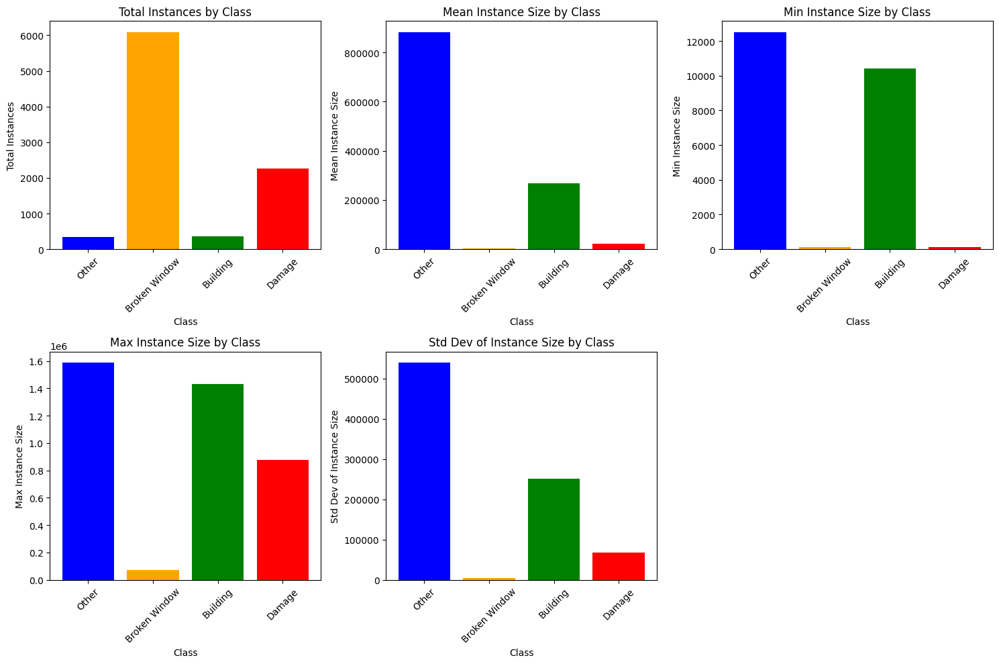

In [ ]:
def plot_instance_statistics(class_statistics):
    """
    Plot instance statistics for each class as bar charts.

    Args:
        class_statistics (dict): Dictionary containing computed statistics per class.
    """
    # Extract class names and statistics
    classes = list(class_statistics.keys())

    # Extract values for each metric
    total_instances = [int(class_statistics[c]["Total Instances"]) for c in classes]
    mean_sizes = [class_statistics[c]["Mean Instance Size"] for c in classes]
    min_sizes = [class_statistics[c]["Min Instance Size"] for c in classes]
    max_sizes = [class_statistics[c]["Max Instance Size"] for c in classes]
    std_devs = [class_statistics[c]["Std Dev of Instance Size"] for c in classes]

    # Define plot settings
    metrics = ["Total Instances", "Mean Instance Size", "Min Instance Size", "Max Instance Size", "Std Dev of Instance Size"]
    values = [total_instances, mean_sizes, min_sizes, max_sizes, std_devs]

    # Create bar plots for each metric
    plt.figure(figsize=(15, 10))

    for i, metric in enumerate(metrics):
        plt.subplot(2, 3, i + 1)  # Arrange subplots in a 2x3 grid
        plt.bar(classes, values[i], color=["blue", "orange", "green", "red"])
        plt.xlabel("Class")
        plt.ylabel(metric)
        plt.title(f"{metric} by Class")
        plt.xticks(rotation=45)

    plt.tight_layout()
    plt.show()

plot_instance_statistics(class_statistics)
